<a href="https://colab.research.google.com/github/jspaezp/volcano_prediction/blob/main/20201120_Volcanos_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install dependencies: 
!pip install tqdm
!pip install PyWavelets
!pip install seaborn

!pip install pyyaml==5.1
!pip install numpy

# opencv is pre-installed on colab

     |████████████████████████████████| 276kB 5.7MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=fd271d2963005c36dc675d61f2944df46a1086f303f354153e681700c522345c
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
print(torch.__version__)

1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

1.7.0+cu101


In [ ]:
from google.colab import auth
auth.authenticate_user()
!gcloud config set project	banded-edge-281502
!mkdir volcano_data 

Updated property [core/project].


In [ ]:
%cd /content
! if [[ ! -f volcano_tensor_train.tar ]] ; then gsutil cp gs://20201118-volcanos/volcano_tensor_train.tar volcano_tensor_train.tar ; fi

/content
Copying gs://20201118-volcanos/volcano_tensor_train.tar...
/ [1 files][  8.3 GiB/  8.3 GiB]   45.6 MiB/s                                   
Operation completed over 1 objects/8.3 GiB.                                      


In [ ]:
! tar -xf volcano_tensor_train.tar -C volcano_data/

In [ ]:
%cd /content
! git clone https://github.com/jspaezp/volcano_prediction 
! cd /content/volcano_prediction ; git pull
%cd /content/volcano_prediction

/content
Cloning into 'volcano_prediction'...
remote: Enumerating objects: 216, done.
remote: Counting objects: 100% (216/216), done.
remote: Compressing objects: 100% (147/147), done.
remote: Total 216 (delta 135), reused 148 (delta 67), pack-reused 0
Receiving objects: 100% (216/216), 5.13 MiB | 4.13 MiB/s, done.
Resolving deltas: 100% (135/135), done.
Already up to date.
/content/volcano_prediction


In [ ]:
%load_ext tensorboard
%reload_ext tensorboard
! rm -rf ./runs
! rm *.pt *.png

rm: cannot remove '*.pt': No such file or directory
rm: cannot remove '*.png': No such file or directory


In [ ]:
from tensorboard import notebook
notebook.list() # View open TensorBoard instances

No known TensorBoard instances running.


In [ ]:
! mkdir ./runs
%tensorboard --logdir ./runs

mkdir: cannot create directory ‘./runs’: File exists


<IPython.core.display.Javascript object>

/content/volcano_prediction
Validating Paths
Validation Done for 3988 Files
Validating Paths
Validation Done for 444 Files
Validating Paths
Validation Done for 443 Files


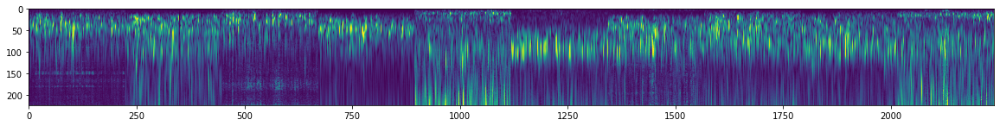

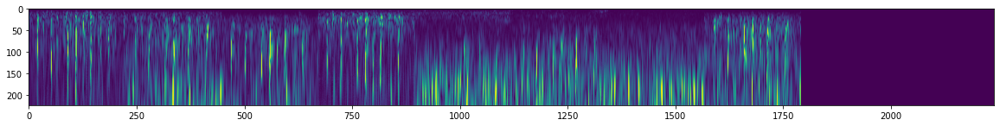

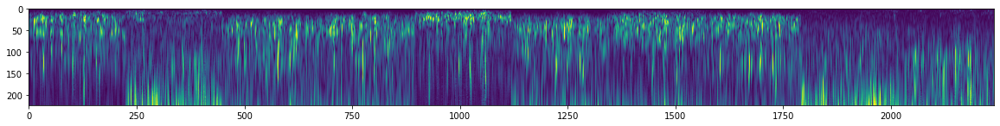

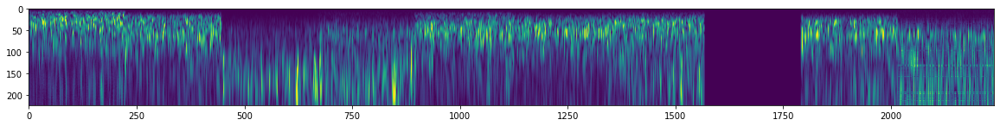

In [ ]:
%cd /content/volcano_prediction

from visualize import show_tensor
from train import get_dataloaders
from pathlib import Path
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [20, 10]

train, test, val = get_dataloaders("./sample_data/train.csv", 4, Path("../volcano_data/train-tensors"), "cpu")

t = 0
for i in train:
    imgs, preds = i
    plt.imshow( torch.cat([imgs[0, x, :, :] for x in range(10)],1) )
    plt.show()
    t += 1
    if t >= 2:
        break

t = 0
for i in train:
    imgs, preds = i
    plt.imshow( torch.cat([imgs[0, x, :, :] for x in range(10)],1) )
    plt.show()
    t += 1
    if t >= 2:
        break


In [ ]:

from train import train
from v_models import densenet_10r, resnet_10r


network_types = {
    #'resnet16' : [resnet_10r, {'layers': [2,2,2,2]}],
    'resnet50' : [resnet_10r, {'layers': [3, 4, 6, 3]}],
    #"densenet121" : [densenet_10r, {'growth_rate': 32, 'block_config': (6, 12, 24, 16), 'num_init_features': 64}],
    'densenet161' : [densenet_10r, {'growth_rate': 48, 'block_config': (6, 12, 36, 24), 'num_init_features': 96}]

}

In [ ]:
! rm *.pt *.png

rm: cannot remove '*.pt': No such file or directory
rm: cannot remove '*.png': No such file or directory


In [ ]:
%cd /content/volcano_prediction
import tqdm
getattr(tqdm, '_instances', {}).clear()

from torch import nn
from train import to_device, optim, SummaryWriter, get_dataloaders, train_loop

batch_sizes =  [8]
learn_rates = [0.001]
network_types

pbar = tqdm.auto.tqdm(total = len(batch_sizes) * len(learn_rates) * len(network_types))

for batch_size in batch_sizes:
    train, test, val = get_dataloaders(
        train_csv_file = "./sample_data/train.csv",
        data_path = Path("../volcano_data/train-tensors"),
        device = "cuda", batch_size = batch_size,
        num_workers=4)

    for lr in learn_rates:
        for k, v in network_types.items():
            
            net = v[0](**v[1])
            to_device(net, "cuda")

            criterion = nn.MSELoss()
            optimizer = optim.Adam(net.parameters(), lr = lr * batch_size)

            prefix = f"{k}_lr{lr}_btch{batch_size}"
            writer = SummaryWriter(comment = prefix)

            print(prefix)

            model = train_loop(
                net = net,
                prefix=prefix,
                trainloader = train, 
                testloader = test,
                valloader = val,
                criterion = criterion,
                optimizer = optimizer,
                writer = writer,
                out_dir = ".",
                epochs = 100,
                niter = 5000)
            pbar.update(1)
pbar.close()

/content/volcano_prediction


Validating Paths
Validation Done for 3988 Files
Validating Paths
Validation Done for 444 Files
Validating Paths
Validation Done for 443 Files
resnet50_lr0.001_btch8

>>>> Prefix: resnet50_lr0.001_btch8 <<<<


>> resnet50_lr0.001_btch8 Epoch: 0 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0012, MAE: 0.14955, MSE: 0.03474
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.0180, MAE: 0.14223, MSE: 0.03052

>> resnet50_lr0.001_btch8 Epoch: 1 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0552, MAE: 0.13419, MSE: 0.02600
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.0712, MAE: 0.12714, MSE: 0.02508

>> resnet50_lr0.001_btch8 Epoch: 2 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0429, MAE: 0.12335, MSE: 0.02147
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.0353, MAE: 0.12152, MSE: 0.02121

>> resnet50_lr0.001_btch8 Epoch: 3 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0669, MAE: 0.12035, MSE: 0.02115
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.1011, MAE: 0.11327, MSE: 0.01909

>> resnet50_lr0.001_btch8 Epoch: 4 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0716, MAE: 0.12438, MSE: 0.02170
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.0859, MAE: 0.11970, MSE: 0.02073

>> resnet50_lr0.001_btch8 Epoch: 5 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0553, MAE: 0.12299, MSE: 0.02118
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.0706, MAE: 0.11797, MSE: 0.01973

>> resnet50_lr0.001_btch8 Epoch: 6 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0106, MAE: 0.12745, MSE: 0.02331
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.0325, MAE: 0.11988, MSE: 0.02111

>> resnet50_lr0.001_btch8 Epoch: 7 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0327, MAE: 0.12857, MSE: 0.02339
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.0349, MAE: 0.12093, MSE: 0.02241

>> resnet50_lr0.001_btch8 Epoch: 8 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0521, MAE: 0.12089, MSE: 0.01885
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.1127, MAE: 0.11440, MSE: 0.01766

>> resnet50_lr0.001_btch8 Epoch: 9 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.0796, MAE: 0.11524, MSE: 0.01754
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.1162, MAE: 0.11020, MSE: 0.01629

>> resnet50_lr0.001_btch8 Epoch: 10 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.1160, MAE: 0.10995, MSE: 0.01712
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.1578, MAE: 0.10705, MSE: 0.01592

>> resnet50_lr0.001_btch8 Epoch: 11 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.1014, MAE: 0.11344, MSE: 0.01719
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.1325, MAE: 0.10992, MSE: 0.01608

>> resnet50_lr0.001_btch8 Epoch: 12 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.1344, MAE: 0.10987, MSE: 0.01731
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.1578, MAE: 0.10867, MSE: 0.01672

>> resnet50_lr0.001_btch8 Epoch: 13 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.1528, MAE: 0.10654, MSE: 0.01626
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.2027, MAE: 0.10140, MSE: 0.01487

>> resnet50_lr0.001_btch8 Epoch: 14 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.1477, MAE: 0.11089, MSE: 0.01751
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.2243, MAE: 0.10586, MSE: 0.01606

>> resnet50_lr0.001_btch8 Epoch: 15 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.2023, MAE: 0.10188, MSE: 0.01517
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.2898, MAE: 0.09702, MSE: 0.01305

>> resnet50_lr0.001_btch8 Epoch: 16 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.2909, MAE: 0.10217, MSE: 0.01462
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.3476, MAE: 0.09413, MSE: 0.01288

>> resnet50_lr0.001_btch8 Epoch: 17 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.2089, MAE: 0.10436, MSE: 0.01515
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.2482, MAE: 0.09949, MSE: 0.01376

>> resnet50_lr0.001_btch8 Epoch: 18 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.3866, MAE: 0.09099, MSE: 0.01228
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.4122, MAE: 0.08693, MSE: 0.01107

>> resnet50_lr0.001_btch8 Epoch: 19 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.4317, MAE: 0.08428, MSE: 0.01096
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.4515, MAE: 0.08292, MSE: 0.01020

>> resnet50_lr0.001_btch8 Epoch: 20 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.5524, MAE: 0.07594, MSE: 0.00903
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.5556, MAE: 0.07363, MSE: 0.00893

>> resnet50_lr0.001_btch8 Epoch: 21 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.6230, MAE: 0.07755, MSE: 0.00918
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.6000, MAE: 0.07292, MSE: 0.00875

>> resnet50_lr0.001_btch8 Epoch: 22 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.7065, MAE: 0.05959, MSE: 0.00566
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.6773, MAE: 0.06096, MSE: 0.00599

>> resnet50_lr0.001_btch8 Epoch: 23 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.6262, MAE: 0.06720, MSE: 0.00781
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.6839, MAE: 0.06337, MSE: 0.00667

>> resnet50_lr0.001_btch8 Epoch: 24 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.7397, MAE: 0.05755, MSE: 0.00540
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.6711, MAE: 0.06508, MSE: 0.00656

>> resnet50_lr0.001_btch8 Epoch: 25 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.7083, MAE: 0.06059, MSE: 0.00580
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.6744, MAE: 0.06311, MSE: 0.00650

>> resnet50_lr0.001_btch8 Epoch: 26 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.7527, MAE: 0.05570, MSE: 0.00497
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.6879, MAE: 0.05967, MSE: 0.00589

>> resnet50_lr0.001_btch8 Epoch: 27 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8070, MAE: 0.04939, MSE: 0.00390
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7495, MAE: 0.05323, MSE: 0.00475

>> resnet50_lr0.001_btch8 Epoch: 28 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.7909, MAE: 0.04955, MSE: 0.00409
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7352, MAE: 0.05360, MSE: 0.00488

>> resnet50_lr0.001_btch8 Epoch: 29 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8173, MAE: 0.05289, MSE: 0.00440
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7722, MAE: 0.05413, MSE: 0.00470

>> resnet50_lr0.001_btch8 Epoch: 30 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8237, MAE: 0.04809, MSE: 0.00376
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7593, MAE: 0.05318, MSE: 0.00463

>> resnet50_lr0.001_btch8 Epoch: 31 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8023, MAE: 0.05063, MSE: 0.00396
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7449, MAE: 0.05474, MSE: 0.00477

>> resnet50_lr0.001_btch8 Epoch: 32 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8336, MAE: 0.04870, MSE: 0.00378
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8019, MAE: 0.05049, MSE: 0.00409

>> resnet50_lr0.001_btch8 Epoch: 33 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8386, MAE: 0.05393, MSE: 0.00458
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7616, MAE: 0.05708, MSE: 0.00537

>> resnet50_lr0.001_btch8 Epoch: 34 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8298, MAE: 0.05132, MSE: 0.00413
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7687, MAE: 0.05313, MSE: 0.00467

>> resnet50_lr0.001_btch8 Epoch: 35 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8533, MAE: 0.04565, MSE: 0.00329
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8115, MAE: 0.04579, MSE: 0.00370

>> resnet50_lr0.001_btch8 Epoch: 36 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8515, MAE: 0.04577, MSE: 0.00330
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8053, MAE: 0.04885, MSE: 0.00391

>> resnet50_lr0.001_btch8 Epoch: 37 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8739, MAE: 0.03835, MSE: 0.00248
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8049, MAE: 0.04468, MSE: 0.00365

>> resnet50_lr0.001_btch8 Epoch: 38 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8255, MAE: 0.04584, MSE: 0.00341
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7479, MAE: 0.05125, MSE: 0.00465

>> resnet50_lr0.001_btch8 Epoch: 39 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8790, MAE: 0.04268, MSE: 0.00285
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8079, MAE: 0.04919, MSE: 0.00403

>> resnet50_lr0.001_btch8 Epoch: 40 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8703, MAE: 0.03781, MSE: 0.00248
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7956, MAE: 0.04604, MSE: 0.00374

>> resnet50_lr0.001_btch8 Epoch: 41 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8781, MAE: 0.03896, MSE: 0.00244
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8068, MAE: 0.04613, MSE: 0.00364

>> resnet50_lr0.001_btch8 Epoch: 42 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8569, MAE: 0.05298, MSE: 0.00440
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7893, MAE: 0.05767, MSE: 0.00575

>> resnet50_lr0.001_btch8 Epoch: 43 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9231, MAE: 0.03192, MSE: 0.00164
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8498, MAE: 0.03978, MSE: 0.00290

>> resnet50_lr0.001_btch8 Epoch: 44 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8802, MAE: 0.04035, MSE: 0.00275
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8043, MAE: 0.04688, MSE: 0.00383

>> resnet50_lr0.001_btch8 Epoch: 45 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9174, MAE: 0.03140, MSE: 0.00165
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8136, MAE: 0.04342, MSE: 0.00349

>> resnet50_lr0.001_btch8 Epoch: 46 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9096, MAE: 0.03329, MSE: 0.00191
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8456, MAE: 0.03906, MSE: 0.00309

>> resnet50_lr0.001_btch8 Epoch: 47 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9261, MAE: 0.03192, MSE: 0.00170
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8624, MAE: 0.03992, MSE: 0.00272

>> resnet50_lr0.001_btch8 Epoch: 48 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9250, MAE: 0.02860, MSE: 0.00144
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8436, MAE: 0.03892, MSE: 0.00286

>> resnet50_lr0.001_btch8 Epoch: 49 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9260, MAE: 0.03082, MSE: 0.00156
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8408, MAE: 0.04105, MSE: 0.00317

>> resnet50_lr0.001_btch8 Epoch: 50 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9356, MAE: 0.02926, MSE: 0.00144
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8631, MAE: 0.03963, MSE: 0.00282

>> resnet50_lr0.001_btch8 Epoch: 51 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9482, MAE: 0.02444, MSE: 0.00102
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8507, MAE: 0.03780, MSE: 0.00277

>> resnet50_lr0.001_btch8 Epoch: 52 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9400, MAE: 0.02846, MSE: 0.00137
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8509, MAE: 0.03939, MSE: 0.00302

>> resnet50_lr0.001_btch8 Epoch: 53 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9364, MAE: 0.02991, MSE: 0.00150
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8534, MAE: 0.03915, MSE: 0.00292

>> resnet50_lr0.001_btch8 Epoch: 54 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9490, MAE: 0.02542, MSE: 0.00106
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8774, MAE: 0.03497, MSE: 0.00230

>> resnet50_lr0.001_btch8 Epoch: 55 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9517, MAE: 0.02499, MSE: 0.00102
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8716, MAE: 0.03537, MSE: 0.00240

>> resnet50_lr0.001_btch8 Epoch: 56 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9037, MAE: 0.03188, MSE: 0.00222
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.7941, MAE: 0.04201, MSE: 0.00433

>> resnet50_lr0.001_btch8 Epoch: 57 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9459, MAE: 0.02736, MSE: 0.00121
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8749, MAE: 0.03673, MSE: 0.00243

>> resnet50_lr0.001_btch8 Epoch: 58 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9458, MAE: 0.02520, MSE: 0.00116
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8824, MAE: 0.03356, MSE: 0.00223

>> resnet50_lr0.001_btch8 Epoch: 59 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9483, MAE: 0.02696, MSE: 0.00114
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8793, MAE: 0.03509, MSE: 0.00233

>> resnet50_lr0.001_btch8 Epoch: 60 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9421, MAE: 0.02492, MSE: 0.00112
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8478, MAE: 0.03589, MSE: 0.00282

>> resnet50_lr0.001_btch8 Epoch: 61 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9624, MAE: 0.02675, MSE: 0.00109
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8891, MAE: 0.03654, MSE: 0.00253

>> resnet50_lr0.001_btch8 Epoch: 62 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9349, MAE: 0.02664, MSE: 0.00127
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8649, MAE: 0.03626, MSE: 0.00251

>> resnet50_lr0.001_btch8 Epoch: 63 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9652, MAE: 0.02365, MSE: 0.00091
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8892, MAE: 0.03290, MSE: 0.00224

>> resnet50_lr0.001_btch8 Epoch: 64 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9655, MAE: 0.03045, MSE: 0.00136
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8917, MAE: 0.03764, MSE: 0.00254

>> resnet50_lr0.001_btch8 Epoch: 65 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9633, MAE: 0.02307, MSE: 0.00087
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9023, MAE: 0.03240, MSE: 0.00197

>> resnet50_lr0.001_btch8 Epoch: 66 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9749, MAE: 0.01724, MSE: 0.00049
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8984, MAE: 0.03009, MSE: 0.00186

>> resnet50_lr0.001_btch8 Epoch: 67 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9669, MAE: 0.02055, MSE: 0.00070
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8931, MAE: 0.03383, MSE: 0.00212

>> resnet50_lr0.001_btch8 Epoch: 68 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9751, MAE: 0.01761, MSE: 0.00051
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9069, MAE: 0.02930, MSE: 0.00175

>> resnet50_lr0.001_btch8 Epoch: 69 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9600, MAE: 0.02105, MSE: 0.00077
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8824, MAE: 0.03380, MSE: 0.00215

>> resnet50_lr0.001_btch8 Epoch: 70 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9686, MAE: 0.01932, MSE: 0.00063
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8868, MAE: 0.03192, MSE: 0.00212

>> resnet50_lr0.001_btch8 Epoch: 71 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9717, MAE: 0.01736, MSE: 0.00055
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9135, MAE: 0.02724, MSE: 0.00159

>> resnet50_lr0.001_btch8 Epoch: 72 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9680, MAE: 0.01857, MSE: 0.00061
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8733, MAE: 0.03206, MSE: 0.00232

>> resnet50_lr0.001_btch8 Epoch: 73 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9246, MAE: 0.02873, MSE: 0.00165
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8304, MAE: 0.03948, MSE: 0.00330

>> resnet50_lr0.001_btch8 Epoch: 74 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9813, MAE: 0.01476, MSE: 0.00038
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9107, MAE: 0.02779, MSE: 0.00164

>> resnet50_lr0.001_btch8 Epoch: 75 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9750, MAE: 0.01781, MSE: 0.00053
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8850, MAE: 0.03227, MSE: 0.00221

>> resnet50_lr0.001_btch8 Epoch: 76 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9647, MAE: 0.02156, MSE: 0.00081
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8850, MAE: 0.03185, MSE: 0.00218

>> resnet50_lr0.001_btch8 Epoch: 77 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9740, MAE: 0.02162, MSE: 0.00079
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9030, MAE: 0.03284, MSE: 0.00220

>> resnet50_lr0.001_btch8 Epoch: 78 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9537, MAE: 0.02291, MSE: 0.00100
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8530, MAE: 0.03363, MSE: 0.00291

>> resnet50_lr0.001_btch8 Epoch: 79 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.8799, MAE: 0.03223, MSE: 0.00255
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8196, MAE: 0.03936, MSE: 0.00343

>> resnet50_lr0.001_btch8 Epoch: 80 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9795, MAE: 0.01583, MSE: 0.00041
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9184, MAE: 0.02864, MSE: 0.00156

>> resnet50_lr0.001_btch8 Epoch: 81 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9844, MAE: 0.01677, MSE: 0.00045
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9217, MAE: 0.02721, MSE: 0.00151

>> resnet50_lr0.001_btch8 Epoch: 82 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9845, MAE: 0.01478, MSE: 0.00035
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9268, MAE: 0.02618, MSE: 0.00136

>> resnet50_lr0.001_btch8 Epoch: 83 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9832, MAE: 0.01904, MSE: 0.00059
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9123, MAE: 0.02809, MSE: 0.00175

>> resnet50_lr0.001_btch8 Epoch: 84 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9846, MAE: 0.01986, MSE: 0.00059
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9133, MAE: 0.02841, MSE: 0.00180

>> resnet50_lr0.001_btch8 Epoch: 85 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9709, MAE: 0.02347, MSE: 0.00094
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8956, MAE: 0.03701, MSE: 0.00252

>> resnet50_lr0.001_btch8 Epoch: 86 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9798, MAE: 0.01545, MSE: 0.00040
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9041, MAE: 0.02861, MSE: 0.00177

>> resnet50_lr0.001_btch8 Epoch: 87 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9793, MAE: 0.01666, MSE: 0.00049
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9098, MAE: 0.02689, MSE: 0.00173

>> resnet50_lr0.001_btch8 Epoch: 88 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9804, MAE: 0.01586, MSE: 0.00042
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9081, MAE: 0.02763, MSE: 0.00170

>> resnet50_lr0.001_btch8 Epoch: 89 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9802, MAE: 0.02005, MSE: 0.00063
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9017, MAE: 0.03128, MSE: 0.00212

>> resnet50_lr0.001_btch8 Epoch: 90 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9849, MAE: 0.01372, MSE: 0.00032
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9072, MAE: 0.02599, MSE: 0.00170

>> resnet50_lr0.001_btch8 Epoch: 91 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9886, MAE: 0.01814, MSE: 0.00051
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9164, MAE: 0.02836, MSE: 0.00170

>> resnet50_lr0.001_btch8 Epoch: 92 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9859, MAE: 0.01723, MSE: 0.00044
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8988, MAE: 0.03008, MSE: 0.00201

>> resnet50_lr0.001_btch8 Epoch: 93 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9864, MAE: 0.01220, MSE: 0.00026
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9020, MAE: 0.02757, MSE: 0.00180

>> resnet50_lr0.001_btch8 Epoch: 94 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9774, MAE: 0.02259, MSE: 0.00085
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8940, MAE: 0.03207, MSE: 0.00213

>> resnet50_lr0.001_btch8 Epoch: 95 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9698, MAE: 0.01587, MSE: 0.00062
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.8440, MAE: 0.03216, MSE: 0.00291

>> resnet50_lr0.001_btch8 Epoch: 96 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9845, MAE: 0.01542, MSE: 0.00038
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9123, MAE: 0.02761, MSE: 0.00173

>> resnet50_lr0.001_btch8 Epoch: 97 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9891, MAE: 0.01122, MSE: 0.00022
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9140, MAE: 0.02607, MSE: 0.00159

>> resnet50_lr0.001_btch8 Epoch: 98 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9866, MAE: 0.01610, MSE: 0.00041
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9230, MAE: 0.02681, MSE: 0.00146

>> resnet50_lr0.001_btch8 Epoch: 99 <<




Evaluating
>>resnet50_lr0.001_btch8_test Evaluation Results: Rsq: 0.9890, MAE: 0.01164, MSE: 0.00023
>>resnet50_lr0.001_btch8_val Evaluation Results: Rsq: 0.9193, MAE: 0.02532, MSE: 0.00148
>>> Finished Training, took 191.062 minutes to run <<<

densenet161_lr0.001_btch8

>>>> Prefix: densenet161_lr0.001_btch8 <<<<


>> densenet161_lr0.001_btch8 Epoch: 0 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0041, MAE: 0.24216, MSE: 0.07824
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0097, MAE: 0.24435, MSE: 0.07869

>> densenet161_lr0.001_btch8 Epoch: 1 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0001, MAE: 0.13720, MSE: 0.02709
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0191, MAE: 0.12469, MSE: 0.02282

>> densenet161_lr0.001_btch8 Epoch: 2 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0001, MAE: 0.13405, MSE: 0.02746
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0048, MAE: 0.12703, MSE: 0.02478

>> densenet161_lr0.001_btch8 Epoch: 3 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0016, MAE: 0.13363, MSE: 0.02602
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0153, MAE: 0.12647, MSE: 0.02344

>> densenet161_lr0.001_btch8 Epoch: 4 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0257, MAE: 0.12850, MSE: 0.02415
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0506, MAE: 0.12047, MSE: 0.02180

>> densenet161_lr0.001_btch8 Epoch: 5 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0322, MAE: 0.12539, MSE: 0.02267
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0625, MAE: 0.11627, MSE: 0.02025

>> densenet161_lr0.001_btch8 Epoch: 6 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.1595, MAE: 0.10725, MSE: 0.01604
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.2176, MAE: 0.10018, MSE: 0.01445

>> densenet161_lr0.001_btch8 Epoch: 7 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.2023, MAE: 0.10422, MSE: 0.01524
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.2037, MAE: 0.10246, MSE: 0.01463

>> densenet161_lr0.001_btch8 Epoch: 8 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.3328, MAE: 0.09941, MSE: 0.01419
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.3266, MAE: 0.09529, MSE: 0.01355

>> densenet161_lr0.001_btch8 Epoch: 9 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.3168, MAE: 0.09552, MSE: 0.01327
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.3723, MAE: 0.08841, MSE: 0.01166

>> densenet161_lr0.001_btch8 Epoch: 10 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.4131, MAE: 0.08855, MSE: 0.01145
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.4926, MAE: 0.08153, MSE: 0.00972

>> densenet161_lr0.001_btch8 Epoch: 11 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.4933, MAE: 0.08077, MSE: 0.01038
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.4747, MAE: 0.08209, MSE: 0.01032

>> densenet161_lr0.001_btch8 Epoch: 12 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.4978, MAE: 0.08030, MSE: 0.01027
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.5046, MAE: 0.08048, MSE: 0.00978

>> densenet161_lr0.001_btch8 Epoch: 13 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.4937, MAE: 0.07843, MSE: 0.00964
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.5151, MAE: 0.07501, MSE: 0.00887

>> densenet161_lr0.001_btch8 Epoch: 14 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.4744, MAE: 0.08414, MSE: 0.01061
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.5089, MAE: 0.08080, MSE: 0.00944

>> densenet161_lr0.001_btch8 Epoch: 15 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.4519, MAE: 0.08650, MSE: 0.01137
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.4898, MAE: 0.08289, MSE: 0.01041

>> densenet161_lr0.001_btch8 Epoch: 16 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.4233, MAE: 0.08430, MSE: 0.01112
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.4794, MAE: 0.07674, MSE: 0.00969

>> densenet161_lr0.001_btch8 Epoch: 17 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.5154, MAE: 0.08410, MSE: 0.01076
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.5651, MAE: 0.07881, MSE: 0.00933

>> densenet161_lr0.001_btch8 Epoch: 18 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.6097, MAE: 0.06871, MSE: 0.00742
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.6194, MAE: 0.06806, MSE: 0.00699

>> densenet161_lr0.001_btch8 Epoch: 19 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.6906, MAE: 0.06049, MSE: 0.00607
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.6623, MAE: 0.06211, MSE: 0.00629

>> densenet161_lr0.001_btch8 Epoch: 20 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.6277, MAE: 0.07146, MSE: 0.00820
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.6406, MAE: 0.07083, MSE: 0.00764

>> densenet161_lr0.001_btch8 Epoch: 21 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.6772, MAE: 0.06283, MSE: 0.00617
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.6523, MAE: 0.06346, MSE: 0.00636

>> densenet161_lr0.001_btch8 Epoch: 22 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.7368, MAE: 0.05764, MSE: 0.00532
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.6671, MAE: 0.06239, MSE: 0.00630

>> densenet161_lr0.001_btch8 Epoch: 23 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.7579, MAE: 0.05848, MSE: 0.00515
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.6970, MAE: 0.06178, MSE: 0.00596

>> densenet161_lr0.001_btch8 Epoch: 24 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.7060, MAE: 0.06106, MSE: 0.00612
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.6999, MAE: 0.05910, MSE: 0.00591

>> densenet161_lr0.001_btch8 Epoch: 25 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.7577, MAE: 0.05611, MSE: 0.00491
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.7062, MAE: 0.06142, MSE: 0.00593

>> densenet161_lr0.001_btch8 Epoch: 26 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.3350, MAE: 0.08585, MSE: 0.01442
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.3162, MAE: 0.08707, MSE: 0.01485

>> densenet161_lr0.001_btch8 Epoch: 27 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0030, MAE: 0.18663, MSE: 0.06590
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0000, MAE: 0.18144, MSE: 0.06657

>> densenet161_lr0.001_btch8 Epoch: 28 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0010, MAE: 0.62766, MSE: 0.42279
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0002, MAE: 0.63256, MSE: 0.42755

>> densenet161_lr0.001_btch8 Epoch: 29 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0091, MAE: 0.69123, MSE: 0.50615
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0081, MAE: 0.69506, MSE: 0.51005

>> densenet161_lr0.001_btch8 Epoch: 30 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0017, MAE: 0.76156, MSE: 0.92666
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0085, MAE: 0.75974, MSE: 0.92121

>> densenet161_lr0.001_btch8 Epoch: 31 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0058, MAE: 0.96912, MSE: 1.57180
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0103, MAE: 0.96874, MSE: 1.59255

>> densenet161_lr0.001_btch8 Epoch: 32 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0052, MAE: 1.03803, MSE: 1.25261
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0034, MAE: 1.04217, MSE: 1.27105

>> densenet161_lr0.001_btch8 Epoch: 33 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0080, MAE: 0.48034, MSE: 0.26612
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0352, MAE: 0.48285, MSE: 0.26479

>> densenet161_lr0.001_btch8 Epoch: 34 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0001, MAE: 0.88693, MSE: 1.40221
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0003, MAE: 0.88647, MSE: 1.37321

>> densenet161_lr0.001_btch8 Epoch: 35 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0035, MAE: 1.78085, MSE: 3.79616
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0024, MAE: 1.78339, MSE: 3.77676

>> densenet161_lr0.001_btch8 Epoch: 36 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0021, MAE: 0.77808, MSE: 0.66974
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0005, MAE: 0.77976, MSE: 0.67961

>> densenet161_lr0.001_btch8 Epoch: 37 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0076, MAE: 1.11201, MSE: 1.30761
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0349, MAE: 1.11430, MSE: 1.31044

>> densenet161_lr0.001_btch8 Epoch: 38 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0040, MAE: 0.50065, MSE: 0.27276
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0006, MAE: 0.50328, MSE: 0.27566

>> densenet161_lr0.001_btch8 Epoch: 39 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0130, MAE: 0.48231, MSE: 0.25725
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0022, MAE: 0.48576, MSE: 0.26086

>> densenet161_lr0.001_btch8 Epoch: 40 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0015, MAE: 1.59050, MSE: 4.33435
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0007, MAE: 1.58997, MSE: 4.32693

>> densenet161_lr0.001_btch8 Epoch: 41 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0000, MAE: 1.25474, MSE: 1.62113
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0018, MAE: 1.25809, MSE: 1.62563

>> densenet161_lr0.001_btch8 Epoch: 42 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0010, MAE: 0.57104, MSE: 0.38500
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0000, MAE: 0.57083, MSE: 0.38178

>> densenet161_lr0.001_btch8 Epoch: 43 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0194, MAE: 0.91927, MSE: 0.86549
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0069, MAE: 0.92261, MSE: 0.87230

>> densenet161_lr0.001_btch8 Epoch: 44 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0108, MAE: 1.94922, MSE: 3.94169
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0084, MAE: 1.94566, MSE: 3.92252

>> densenet161_lr0.001_btch8 Epoch: 45 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0306, MAE: 0.78492, MSE: 0.97425
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0499, MAE: 0.78701, MSE: 0.97712

>> densenet161_lr0.001_btch8 Epoch: 46 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0003, MAE: 0.63571, MSE: 0.44288
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0008, MAE: 0.67253, MSE: 0.99383

>> densenet161_lr0.001_btch8 Epoch: 47 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0012, MAE: 0.76830, MSE: 0.69614
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0004, MAE: 0.76534, MSE: 0.68989

>> densenet161_lr0.001_btch8 Epoch: 48 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0016, MAE: 0.97967, MSE: 0.99490
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0001, MAE: 0.98033, MSE: 0.99811

>> densenet161_lr0.001_btch8 Epoch: 49 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0010, MAE: 0.37702, MSE: 0.19012
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0014, MAE: 0.39982, MSE: 0.31028

>> densenet161_lr0.001_btch8 Epoch: 50 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0001, MAE: 0.38046, MSE: 0.16808
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0007, MAE: 0.37865, MSE: 0.16349

>> densenet161_lr0.001_btch8 Epoch: 51 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0015, MAE: 0.47875, MSE: 0.29164
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0068, MAE: 0.47483, MSE: 0.28020

>> densenet161_lr0.001_btch8 Epoch: 52 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0010, MAE: 0.34089, MSE: 0.22319
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0016, MAE: 0.37058, MSE: 0.55198

>> densenet161_lr0.001_btch8 Epoch: 53 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0002, MAE: 0.58820, MSE: 0.56156
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0100, MAE: 0.58811, MSE: 0.56887

>> densenet161_lr0.001_btch8 Epoch: 54 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0088, MAE: 0.43762, MSE: 0.32808
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0029, MAE: 0.40650, MSE: 0.19742

>> densenet161_lr0.001_btch8 Epoch: 55 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0000, MAE: 1.33233, MSE: 1.80253
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0104, MAE: 1.33611, MSE: 1.81405

>> densenet161_lr0.001_btch8 Epoch: 56 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0048, MAE: 0.71128, MSE: 0.52612
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0355, MAE: 0.71705, MSE: 0.53240

>> densenet161_lr0.001_btch8 Epoch: 57 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0116, MAE: 1.36034, MSE: 1.89555
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0000, MAE: 1.36357, MSE: 1.89782

>> densenet161_lr0.001_btch8 Epoch: 58 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0009, MAE: 0.44893, MSE: 0.26606
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0025, MAE: 0.45073, MSE: 0.26602

>> densenet161_lr0.001_btch8 Epoch: 59 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0049, MAE: 0.46884, MSE: 0.23974
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0015, MAE: 0.47177, MSE: 0.24292

>> densenet161_lr0.001_btch8 Epoch: 60 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0085, MAE: 1.50432, MSE: 2.71235
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0068, MAE: 1.51063, MSE: 2.75946

>> densenet161_lr0.001_btch8 Epoch: 61 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0026, MAE: 0.65267, MSE: 0.53215
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0261, MAE: 0.65685, MSE: 0.54504

>> densenet161_lr0.001_btch8 Epoch: 62 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0003, MAE: 0.68918, MSE: 1.57365
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0031, MAE: 0.72787, MSE: 2.20677

>> densenet161_lr0.001_btch8 Epoch: 63 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0016, MAE: 1.98865, MSE: 4.00324
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0047, MAE: 1.99213, MSE: 4.01838

>> densenet161_lr0.001_btch8 Epoch: 64 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0128, MAE: 0.52370, MSE: 0.29392
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0254, MAE: 0.52416, MSE: 0.29309

>> densenet161_lr0.001_btch8 Epoch: 65 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0002, MAE: 0.69455, MSE: 0.65220
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0192, MAE: 0.69804, MSE: 0.67838

>> densenet161_lr0.001_btch8 Epoch: 66 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0155, MAE: 0.55216, MSE: 0.52611
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0326, MAE: 0.54784, MSE: 0.49511

>> densenet161_lr0.001_btch8 Epoch: 67 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0035, MAE: 1.57584, MSE: 3.56858
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0219, MAE: 1.58560, MSE: 3.62625

>> densenet161_lr0.001_btch8 Epoch: 68 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0008, MAE: 0.35763, MSE: 0.15615
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0020, MAE: 0.36924, MSE: 0.18330

>> densenet161_lr0.001_btch8 Epoch: 69 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0000, MAE: 1.94467, MSE: 3.83382
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0000, MAE: 1.93329, MSE: 3.78531

>> densenet161_lr0.001_btch8 Epoch: 70 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0002, MAE: 0.90530, MSE: 0.84345
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0363, MAE: 0.90088, MSE: 0.83790

>> densenet161_lr0.001_btch8 Epoch: 71 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0029, MAE: 1.59884, MSE: 2.58309
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0017, MAE: 1.59950, MSE: 2.58215

>> densenet161_lr0.001_btch8 Epoch: 72 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0045, MAE: 2.98954, MSE: 9.03391
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0000, MAE: 2.99386, MSE: 9.04309

>> densenet161_lr0.001_btch8 Epoch: 73 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0129, MAE: 1.37418, MSE: 2.31021
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0047, MAE: 1.37470, MSE: 2.32259

>> densenet161_lr0.001_btch8 Epoch: 74 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0001, MAE: 0.75566, MSE: 1.26169
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0033, MAE: 0.78224, MSE: 1.51063

>> densenet161_lr0.001_btch8 Epoch: 75 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0026, MAE: 0.82719, MSE: 1.00369
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0001, MAE: 0.82466, MSE: 1.00925

>> densenet161_lr0.001_btch8 Epoch: 76 <<




Evaluating
>>densenet161_lr0.001_btch8_test Evaluation Results: Rsq: 0.0091, MAE: 0.30491, MSE: 0.11316
>>densenet161_lr0.001_btch8_val Evaluation Results: Rsq: 0.0004, MAE: 0.30501, MSE: 0.11541

>> densenet161_lr0.001_btch8 Epoch: 77 <<



KeyboardInterrupt: ignored

In [ ]:
%cd /content/volcano_prediction

! RES_NAME="$(date +"%Y%m%d_%H")_volcano_prediction_tenorboard.tar" ; echo ${RES_NAME}
! RES_NAME="$(date +"%Y%m%d_%H")_volcano_prediction_tenorboard.tar" ; tar -czvf ${RES_NAME} ./runs/*
! RES_NAME="$(date +"%Y%m%d_%H")_volcano_prediction_tenorboard.tar" ; gsutil cp ${RES_NAME} gs://20201118-volcanos/${RES_NAME}

20201121_00_volcano_prediction_tenorboard.tar
tar: ./runs/*: Cannot stat: No such file or directory
tar: Exiting with failure status due to previous errors
Copying file://20201121_00_volcano_prediction_tenorboard.tar [Content-Type=application/x-tar]...
/ [1 files][   45.0 B/   45.0 B]                                                
Operation completed over 1 objects/45.0 B.                                       


In [ ]:
%cd /content/volcano_prediction

! RES_NAME="$(date +"%Y%m%d")volcano_prediction_models.tar" ; echo ${RES_NAME}
! RES_NAME="$(date +"%Y%m%d")volcano_prediction_models.tar" ; tar -czvf ${RES_NAME} ./runs *.png L_0.0014_resnet50_lr0.001_btch8_e_82.pt L_0.0015_resnet50_lr0.001_btch8_e_81.pt L_0.0015_resnet50_lr0.001_btch8_e_98.pt L_0.0015_resnet50_lr0.001_btch8_e_99.pt L_0.0016_resnet50_lr0.001_btch8_e_71.pt L_0.0016_resnet50_lr0.001_btch8_e_74.pt L_0.0059_densenet161_lr0.001_btch8_e_24.pt L_0.0059_densenet161_lr0.001_btch8_e_25.pt L_0.0060_densenet161_lr0.001_btch8_e_23.pt 
! RES_NAME="$(date +"%Y%m%d")volcano_prediction_models.tar" ; gsutil cp ${RES_NAME} gs://20201118-volcanos/${RES_NAME}

/content/volcano_prediction
20201121volcano_prediction_models.tar
./runs/
./runs/Nov20_18-02-55_811d92cdbf63resnet50_lr0.001_btch8/
./runs/Nov20_18-02-55_811d92cdbf63resnet50_lr0.001_btch8/events.out.tfevents.1605895375.811d92cdbf63.55.1
./runs/Nov20_18-01-59_811d92cdbf63resnet50_lr0.001_btch8/
./runs/Nov20_18-01-59_811d92cdbf63resnet50_lr0.001_btch8/events.out.tfevents.1605895321.811d92cdbf63.55.0
./runs/Nov20_21-15-00_811d92cdbf63densenet161_lr0.001_btch8/
./runs/Nov20_21-15-00_811d92cdbf63densenet161_lr0.001_btch8/events.out.tfevents.1605906900.811d92cdbf63.55.3
./runs/Nov20_18-03-55_811d92cdbf63resnet50_lr0.001_btch8/
./runs/Nov20_18-03-55_811d92cdbf63resnet50_lr0.001_btch8/events.out.tfevents.1605895435.811d92cdbf63.55.2
densenet161_lr0.001_btch8_epoch_0.png
densenet161_lr0.001_btch8_epoch_10.png
densenet161_lr0.001_btch8_epoch_11.png
densenet161_lr0.001_btch8_epoch_12.png
densenet161_lr0.001_btch8_epoch_13.png
densenet161_lr0.001_btch8_epoch_14.png
densenet161_lr0.001_btch8_epoch

In [ ]:
%cd /content/volcano_prediction

! ls *.pt

/content/volcano_prediction
L_0.0014_resnet50_lr0.001_btch8_e_82.pt
L_0.0015_resnet50_lr0.001_btch8_e_81.pt
L_0.0015_resnet50_lr0.001_btch8_e_98.pt
L_0.0015_resnet50_lr0.001_btch8_e_99.pt
L_0.0016_resnet50_lr0.001_btch8_e_71.pt
L_0.0016_resnet50_lr0.001_btch8_e_74.pt
L_0.0016_resnet50_lr0.001_btch8_e_80.pt
L_0.0016_resnet50_lr0.001_btch8_e_97.pt
L_0.0017_resnet50_lr0.001_btch8_e_68.pt
L_0.0017_resnet50_lr0.001_btch8_e_87.pt
L_0.0017_resnet50_lr0.001_btch8_e_88.pt
L_0.0017_resnet50_lr0.001_btch8_e_90.pt
L_0.0017_resnet50_lr0.001_btch8_e_91.pt
L_0.0017_resnet50_lr0.001_btch8_e_96.pt
L_0.0018_resnet50_lr0.001_btch8_e_83.pt
L_0.0018_resnet50_lr0.001_btch8_e_84.pt
L_0.0018_resnet50_lr0.001_btch8_e_86.pt
L_0.0018_resnet50_lr0.001_btch8_e_93.pt
L_0.0019_resnet50_lr0.001_btch8_e_66.pt
L_0.0020_resnet50_lr0.001_btch8_e_65.pt
L_0.0020_resnet50_lr0.001_btch8_e_92.pt
L_0.0021_resnet50_lr0.001_btch8_e_67.pt
L_0.0021_resnet50_lr0.001_btch8_e_69.pt
L_0.0021_resnet50_lr0.001_btch8_e_70.pt
L_0.0021_res

In [ ]:
import pandas as pd

full_df = pd.read_csv("./sample_data/train.csv")
full_df

,segment_id,time_to_eruption
0,1136037770,12262005
1,1969647810,32739612
2,1895879680,14965999
3,2068207140,26469720
4,192955606,31072429
...,...,...
4426,873340274,15695097
4427,1297437712,35659379
4428,694853998,31206935
4429,1886987043,9598270


Validating Paths
Validation Done for 4431 Files



>>Train Evaluation Results: Rsq: 0.9800, MAE: 0.01531, MSE: 0.00043
{'mae': 0.015312372, 'r2': 0.980027, 'mse': 0.000433659}


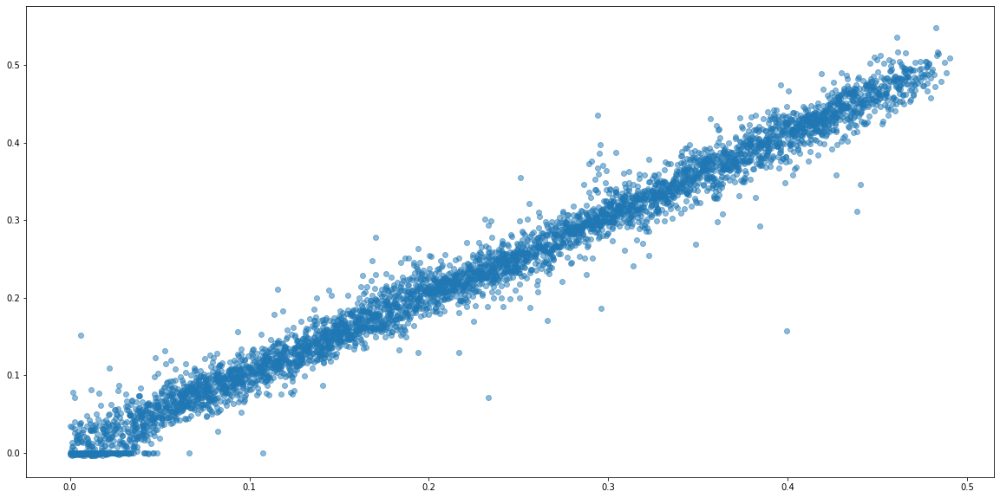


>>Train Evaluation Results: Rsq: 0.9801, MAE: 0.01809, MSE: 0.00057
{'mae': 0.01808726, 'r2': 0.9800837, 'mse': 0.00056842563}


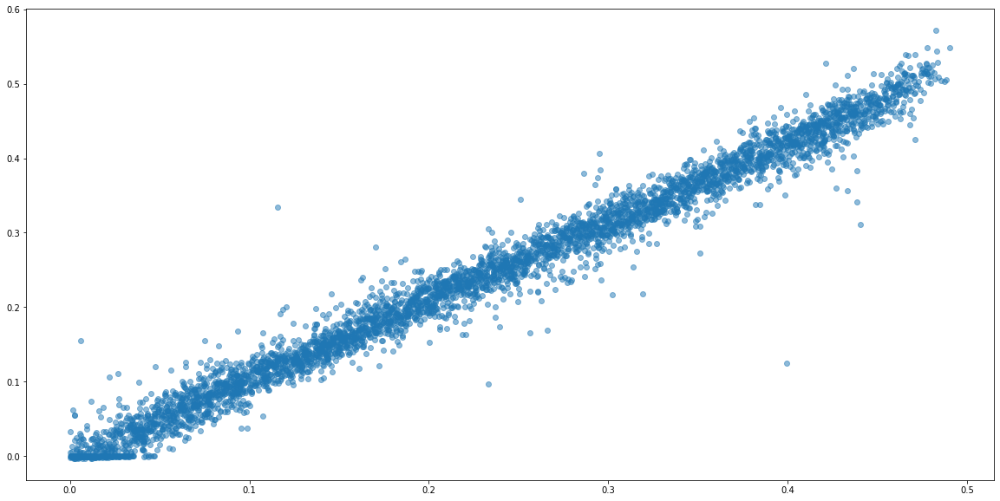


>>Train Evaluation Results: Rsq: 0.9815, MAE: 0.01730, MSE: 0.00054
{'mae': 0.01729812, 'r2': 0.98150384, 'mse': 0.00053800567}


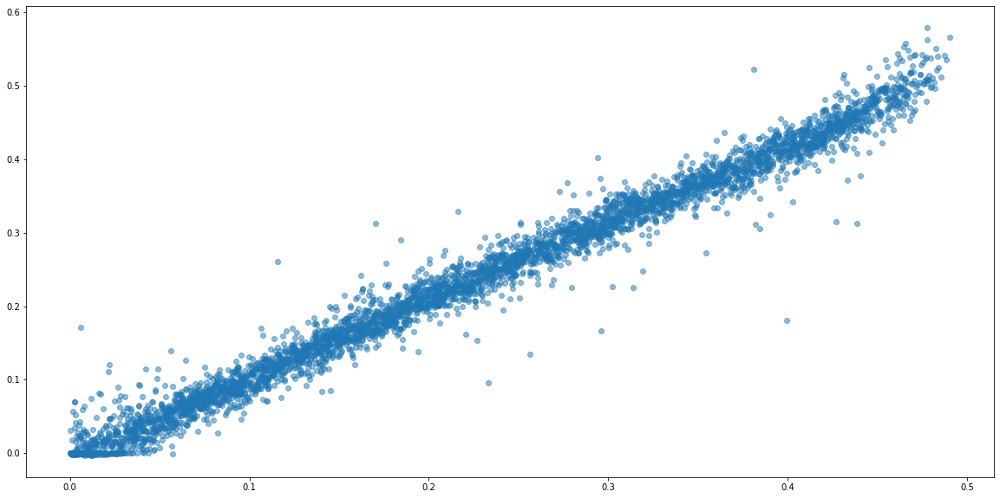


>>Train Evaluation Results: Rsq: 0.9840, MAE: 0.01224, MSE: 0.00032
{'mae': 0.012242759, 'r2': 0.983972, 'mse': 0.00031999132}


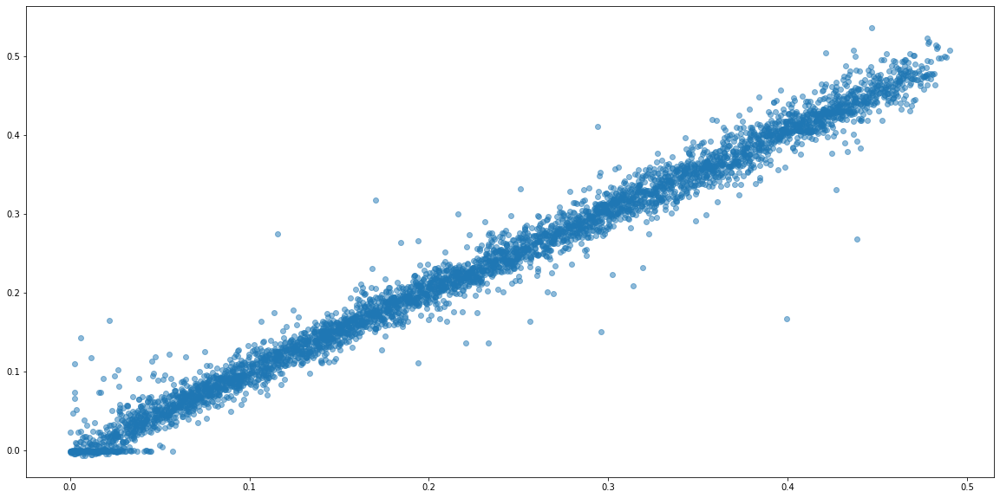


>>Train Evaluation Results: Rsq: 0.9705, MAE: 0.01717, MSE: 0.00056
{'mae': 0.017168665, 'r2': 0.97048163, 'mse': 0.00055542553}


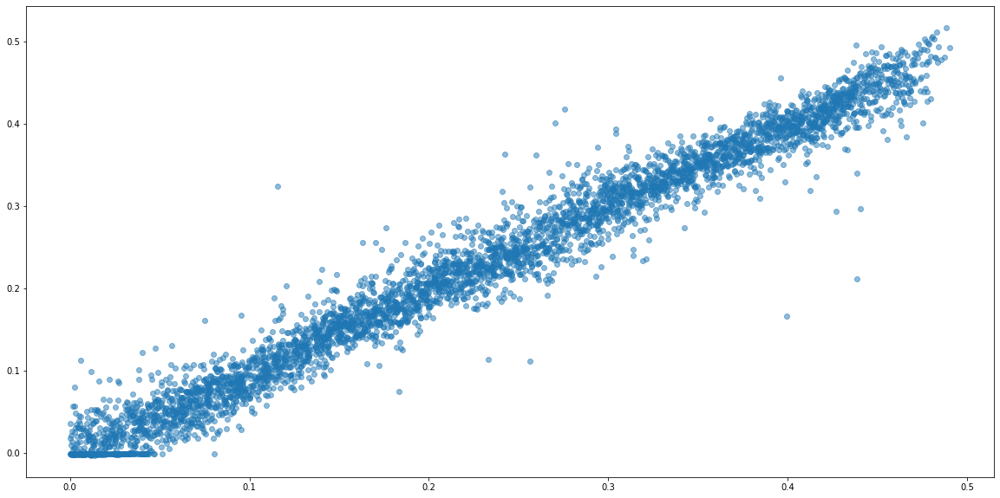


>>Train Evaluation Results: Rsq: 0.9734, MAE: 0.01694, MSE: 0.00053
{'mae': 0.016936166, 'r2': 0.9734249, 'mse': 0.00053426}


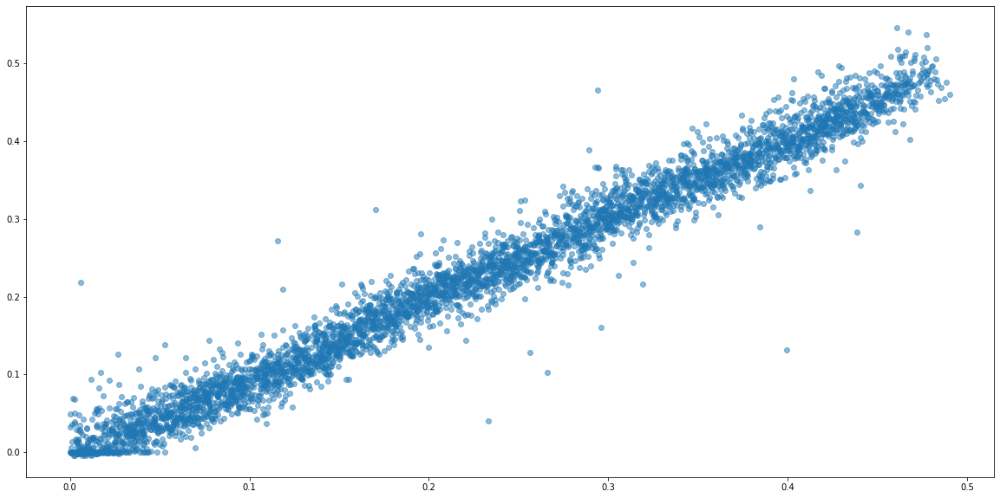


>>Train Evaluation Results: Rsq: 0.7389, MAE: 0.05728, MSE: 0.00534
{'mae': 0.057281714, 'r2': 0.7388696, 'mse': 0.0053437874}


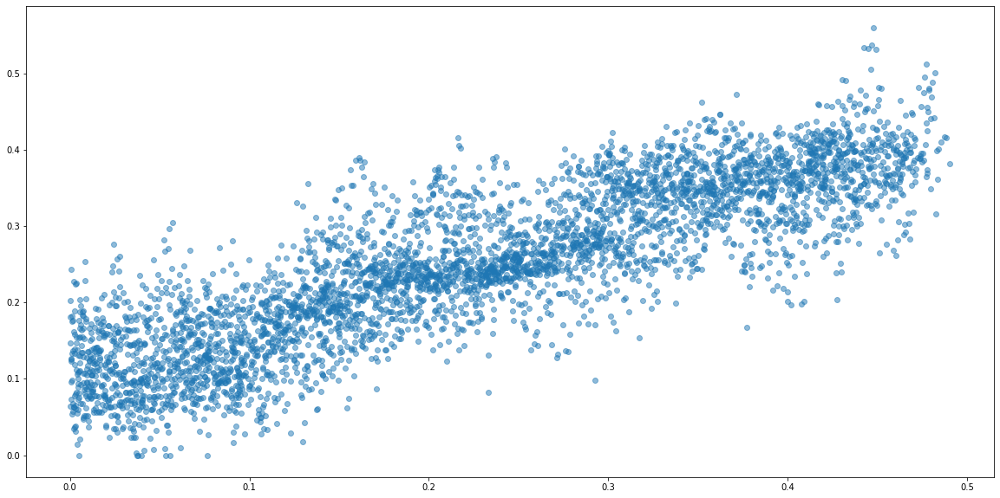


>>Train Evaluation Results: Rsq: 0.7671, MAE: 0.05208, MSE: 0.00449
{'mae': 0.05207687, 'r2': 0.7670706, 'mse': 0.0044903457}


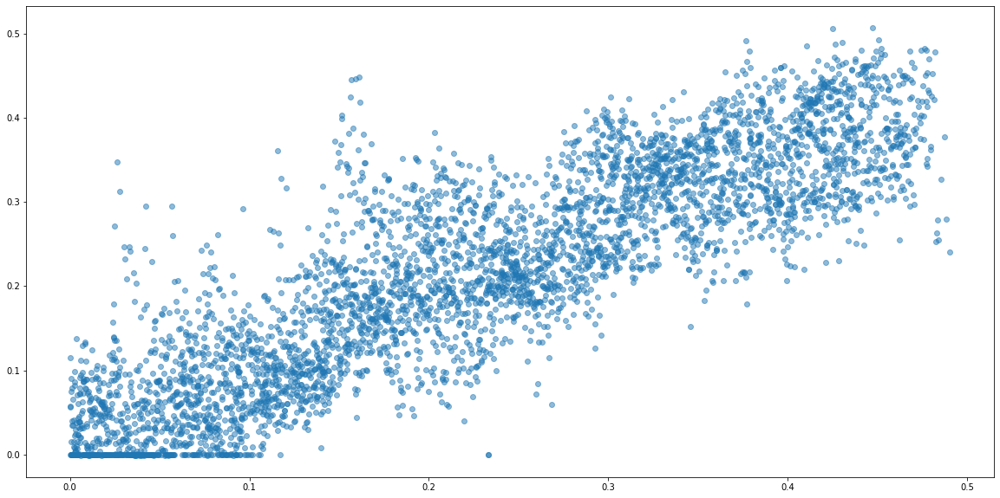


>>Train Evaluation Results: Rsq: 0.7482, MAE: 0.05694, MSE: 0.00490
{'mae': 0.056938123, 'r2': 0.7482111, 'mse': 0.0049027614}


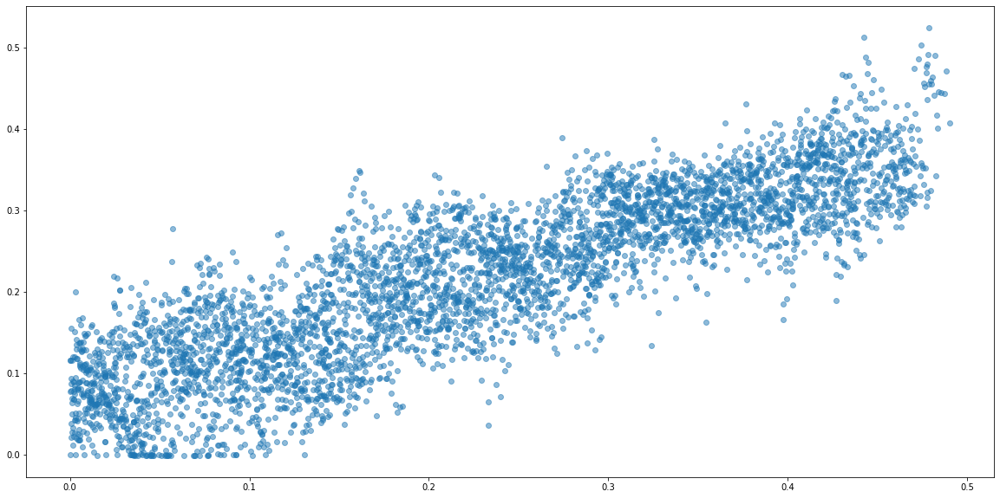

In [ ]:
from train import evaluate, tensorLoader, DeviceDataLoader
import numpy as np
import matplotlib.pyplot as plt

full_df = pd.read_csv("./sample_data/train.csv")

testdata = tensorLoader(full_df, filepath = Path("../volcano_data/train-tensors"))
testloader = torch.utils.data.DataLoader(
    testdata, batch_size=32, shuffle=False, num_workers=5
)
testloader = DeviceDataLoader(testloader)

best_model_names = [
    ['resnet50', "L_0.0014_resnet50_lr0.001_btch8_e_82.pt"],
    ['resnet50', "L_0.0015_resnet50_lr0.001_btch8_e_81.pt"],
    ['resnet50',"L_0.0015_resnet50_lr0.001_btch8_e_98.pt"],
    ['resnet50',"L_0.0015_resnet50_lr0.001_btch8_e_99.pt"],
    ['resnet50',"L_0.0016_resnet50_lr0.001_btch8_e_71.pt"],
    ['resnet50',"L_0.0016_resnet50_lr0.001_btch8_e_74.pt"],
    ['densenet161',"L_0.0059_densenet161_lr0.001_btch8_e_24.pt"],
    ['densenet161',"L_0.0059_densenet161_lr0.001_btch8_e_25.pt"],
    ['densenet161',"L_0.0060_densenet161_lr0.001_btch8_e_23.pt"]]

for model_name in best_model_names:
    model = network_types[model_name[0]][0](**network_types[model_name[0]][1])
    model.load_state_dict(torch.load(f"/content/volcano_prediction/{model_name[1]}"))
    to_device(model, "cuda")

    expected, predicted, metrics = evaluate(model, testloader)
    y_vals = np.concatenate([x.to("cpu").numpy() for x in predicted]).flatten()

    full_df[model_name[1]] = (1e8*y_vals).astype(np.int64) 
    print(metrics)

    x_vals = np.concatenate([x.to("cpu").numpy() for x in expected]).flatten()
    plt.scatter(x_vals, y_vals, alpha=0.5)
    plt.show()

In [ ]:
print(full_df)
full_df.to_csv(f"all_models_preds_{int(time.time())}.csv")

      segment_id  ...  L_0.0060_densenet161_lr0.001_btch8_e_23.pt
0     1136037770  ...                                     9609865
1     1969647810  ...                                    32271802
2     1895879680  ...                                    10503808
3     2068207140  ...                                    25344044
4      192955606  ...                                    31899274
...          ...  ...                                         ...
4426   873340274  ...                                    18060104
4427  1297437712  ...                                    29566156
4428   694853998  ...                                    27149594
4429  1886987043  ...                                    11672799
4430  1100632800  ...                                    27730828

[4431 rows x 11 columns]


Testing how different are results when shuffling the input channels (maybe the shuffles can be used for an ensamble model)

Validating Paths
Validation Done for 4431 Files



>>Train Evaluation Results: Rsq: 0.9345, MAE: 0.02463, MSE: 0.00130
{'mae': 0.0246264, 'r2': 0.93453676, 'mse': 0.0013030267}


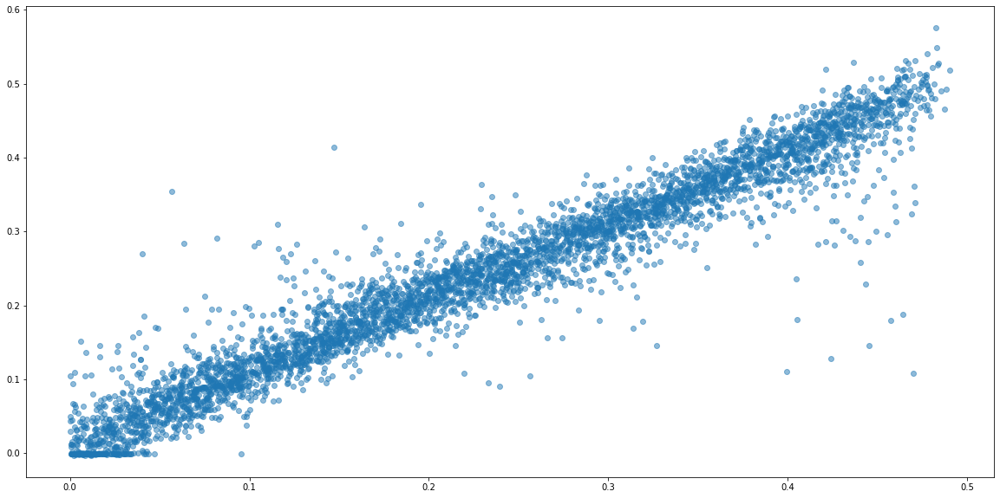


>>Train Evaluation Results: Rsq: 0.9365, MAE: 0.02435, MSE: 0.00127
{'mae': 0.024351409, 'r2': 0.9365068, 'mse': 0.0012694236}


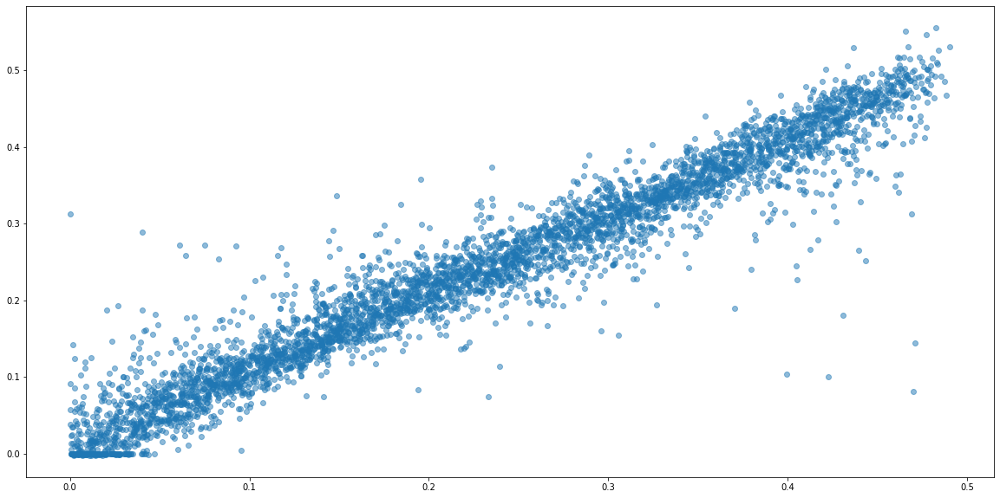


>>Train Evaluation Results: Rsq: 0.9390, MAE: 0.02440, MSE: 0.00123
{'mae': 0.024400268, 'r2': 0.9390188, 'mse': 0.0012289829}


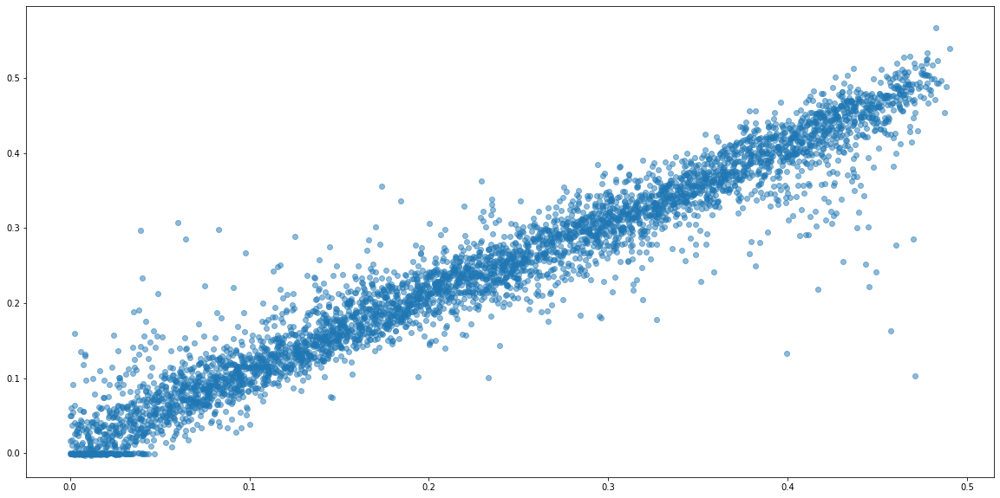


>>Train Evaluation Results: Rsq: 0.9355, MAE: 0.02440, MSE: 0.00130
{'mae': 0.024399819, 'r2': 0.9355113, 'mse': 0.0012988953}


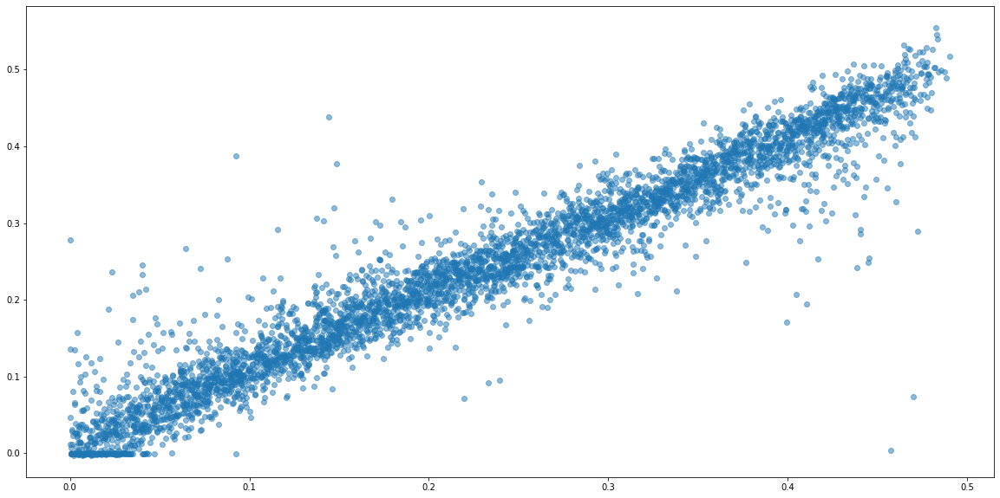


>>Train Evaluation Results: Rsq: 0.9360, MAE: 0.02456, MSE: 0.00128
{'mae': 0.024556885, 'r2': 0.93603754, 'mse': 0.0012799269}


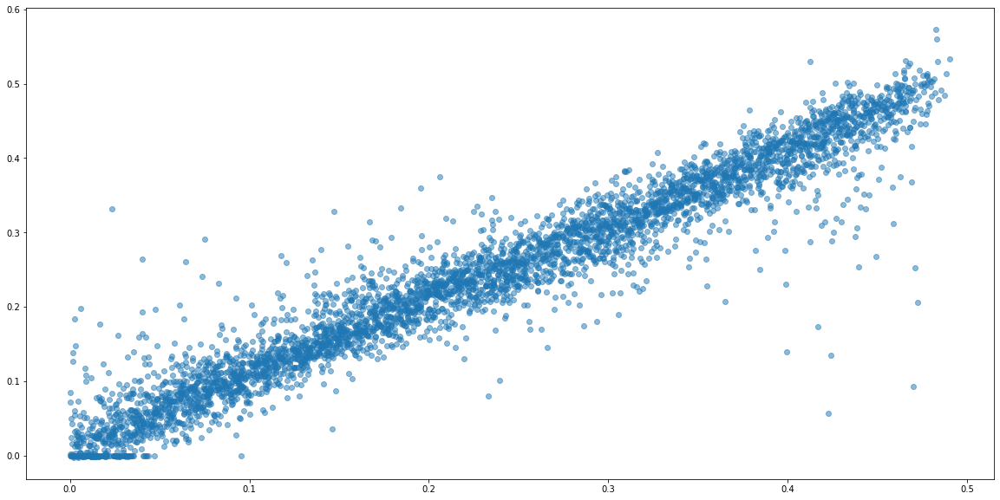


>>Train Evaluation Results: Rsq: 0.9381, MAE: 0.02446, MSE: 0.00124
{'mae': 0.024456, 'r2': 0.9381031, 'mse': 0.001235607}


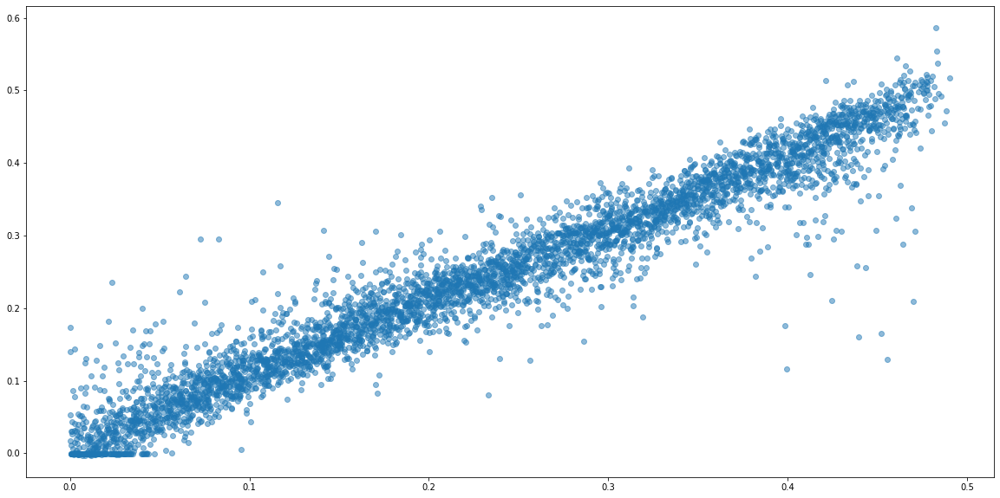


>>Train Evaluation Results: Rsq: 0.9351, MAE: 0.02488, MSE: 0.00129
{'mae': 0.024878602, 'r2': 0.9351103, 'mse': 0.0012915063}


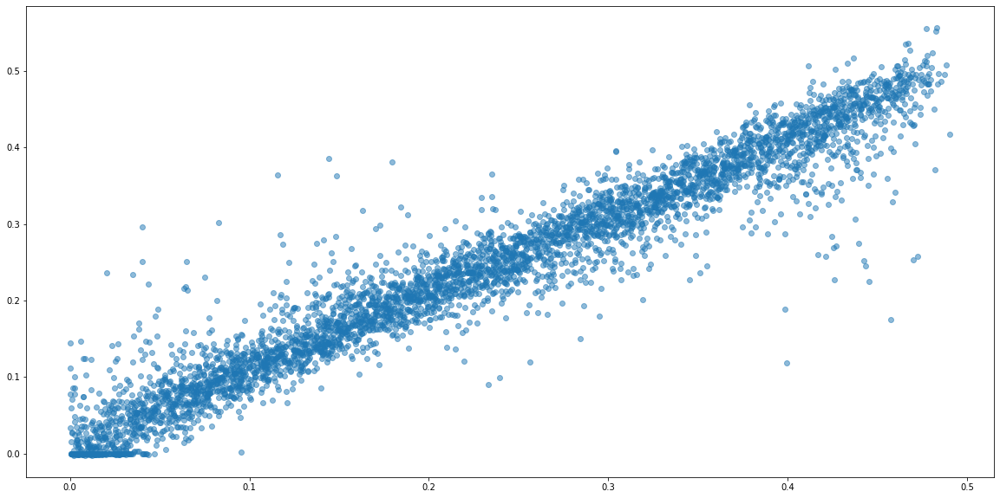


>>Train Evaluation Results: Rsq: 0.9343, MAE: 0.02466, MSE: 0.00132
{'mae': 0.024657387, 'r2': 0.9343368, 'mse': 0.0013174847}


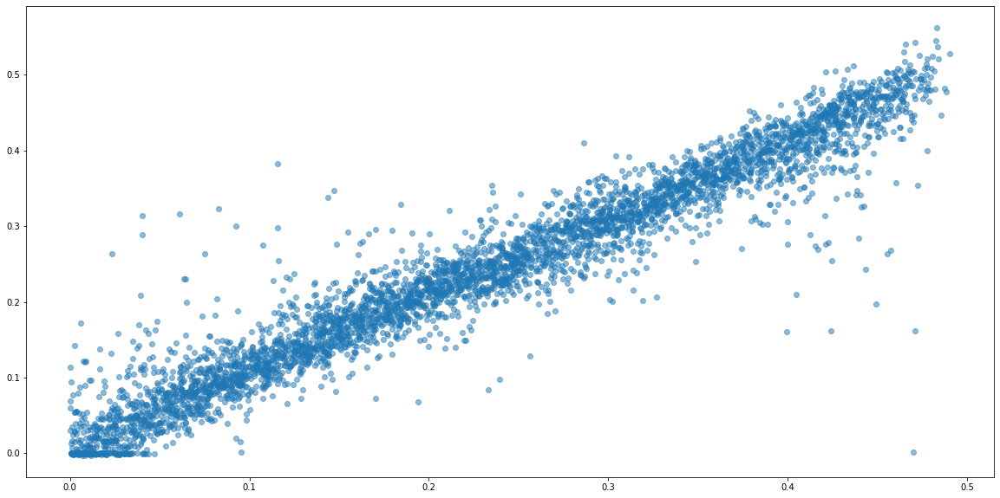


>>Train Evaluation Results: Rsq: 0.9332, MAE: 0.02480, MSE: 0.00133
{'mae': 0.024803037, 'r2': 0.9331678, 'mse': 0.0013326106}


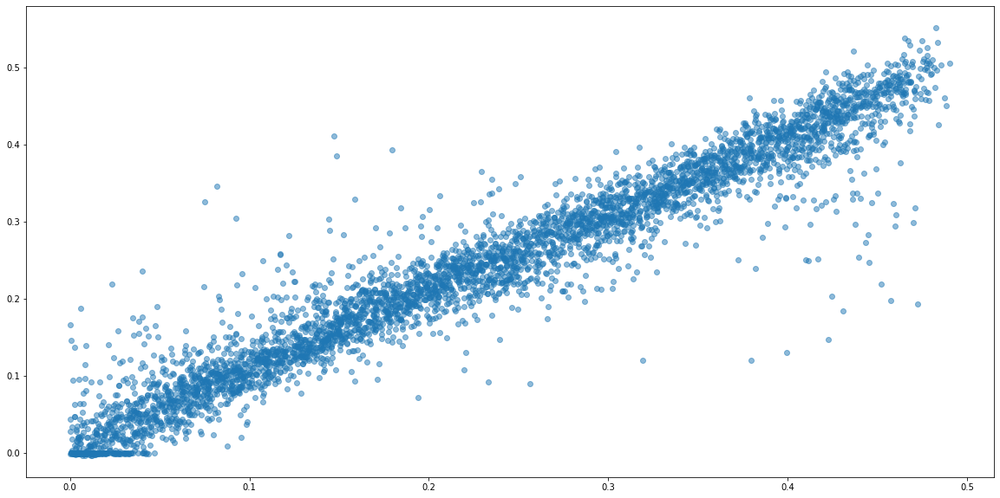


>>Train Evaluation Results: Rsq: 0.9376, MAE: 0.02442, MSE: 0.00125
{'mae': 0.02441569, 'r2': 0.937563, 'mse': 0.0012482749}


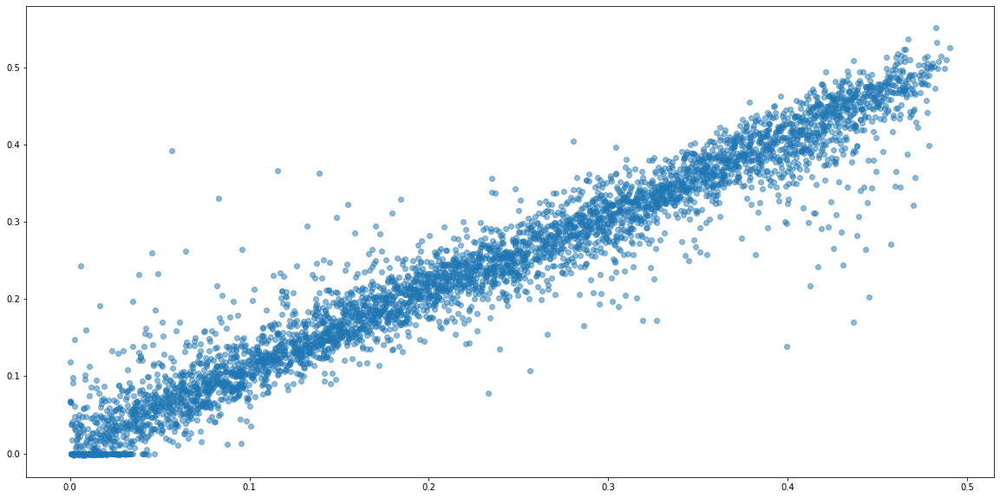

In [ ]:

full_df = pd.read_csv("./sample_data/train.csv")

testdata = tensorLoader(
    full_df, filepath = Path("../volcano_data/train-tensors"), shuffle_channels=1)
testloader = torch.utils.data.DataLoader(
    testdata, batch_size=32, shuffle=False, num_workers=5)
testloader = DeviceDataLoader(testloader)

best_model_names = [
    ['resnet50', "L_0.0015_resnet50_lr0.001_btch8_e_81.pt"]]

for model_name in best_model_names:
    model = network_types[model_name[0]][0](**network_types[model_name[0]][1])
    model.load_state_dict(torch.load(f"/content/volcano_prediction/{model_name[1]}"))
    to_device(model, "cuda")

    for i in range(10):
        with torch.no_grad():
            expected, predicted, metrics = evaluate(model, testloader)
            y_vals = np.concatenate([x.to("cpu").numpy() for x in predicted]).flatten()

            full_df[f"{i}_{model_name[1]}"] = (1e8*y_vals).astype(np.int64) 
            print(metrics)

            x_vals = np.concatenate([x.to("cpu").numpy() for x in expected]).flatten()
            plt.scatter(x_vals, y_vals, alpha=0.5)
            plt.show()

In [ ]:
full_df.to_csv(f"shuffles_L_0.0015_resnet50_lr0.001_btch8_e_81.pt_preds_{int(time.time())}.csv")

In [ ]:
%cd /content
! if [[ ! -f volcano_tensor_test.tar ]] ; then gsutil cp gs://20201118-volcanos/volcano_tensor_test.tar volcano_tensor_test.tar ; fi


/content
Copying gs://20201118-volcanos/volcano_tensor_test.tar...
/ [1 files][  8.5 GiB/  8.5 GiB]   57.3 MiB/s                                   
Operation completed over 1 objects/8.5 GiB.                                      


In [ ]:
! mkdir volcano_data-test
! tar --checkpoint=.100 -xf volcano_tensor_test.tar -C volcano_data-test/

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [ ]:
from train import evaluate, tensorLoader, DeviceDataLoader
import numpy as np
import matplotlib.pyplot as plt

submssion_dataframe =  pd.read_csv("/content/sample_submission.csv")
submssion_dataframe['time_to_eruption'] = np.random.uniform(1,2,len(submssion_dataframe))
print(submssion_dataframe)
tensors_dir = Path("/content/volcano_data-test/test-tensors")
print(f"Tensors found in the tensors dir location {len(list(tensors_dir.glob('*.pt')))}")

sub_data = tensorLoader(submssion_dataframe, filepath = tensors_dir)
sub_loader = torch.utils.data.DataLoader(
    sub_data, batch_size=32, shuffle=False, num_workers=5
)
sub_loader = DeviceDataLoader(sub_loader)

model_name = ['resnet50', "L_0.0014_resnet50_lr0.001_btch8_e_82.pt"]

model = network_types[model_name[0]][0](**network_types[model_name[0]][1])
    model.load_state_dict(torch.load(f"/content/volcano_prediction/{model_name[1]}"))
    to_device(model, "cuda")

eval_sub_data = evaluate(model, sub_loader)

print(eval_sub_data[2])

x_vals = np.concatenate([x.to("cpu").numpy() for x in eval_sub_data[0]]).flatten()
y_vals = np.concatenate([x.to("cpu").numpy() for x in eval_sub_data[1]]).flatten()


      segment_id  time_to_eruption
0     1000213997          1.425344
1      100023368          1.091110
2     1000488999          1.929064
3     1001028887          1.710427
4     1001857862          1.171789
...          ...               ...
4515   996704281          1.019154
4516   997630809          1.988068
4517   998072137          1.577534
4518   998136924          1.428634
4519    99975682          1.121538

[4520 rows x 2 columns]
Tensors found in the tensors dir location 4520
Validating Paths
Validation Done for 4520 Files



>>Train Evaluation Results: Rsq: 0.0004, MAE: 0.22498, MSE: 0.06359
{'mae': 0.22497801, 'r2': 0.00038764402, 'mse': 0.06358868}


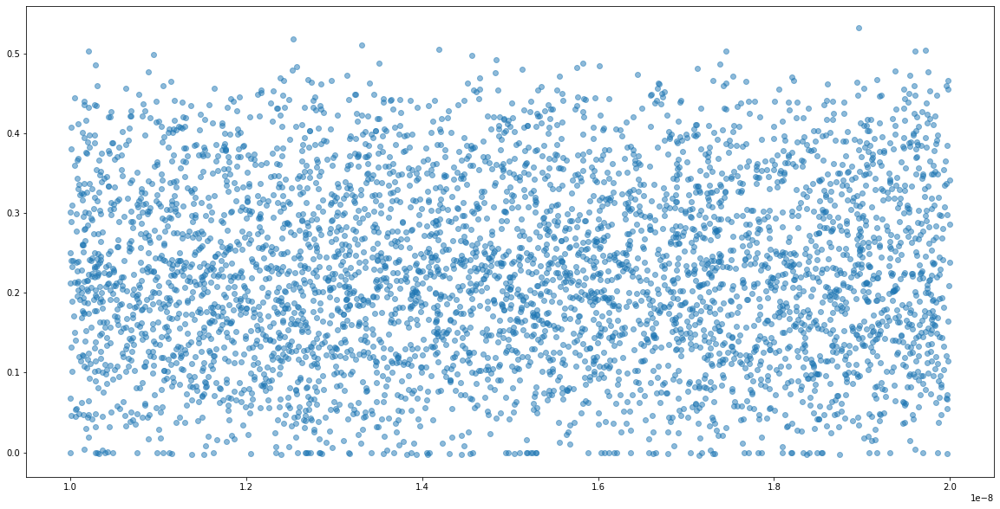

In [ ]:

submssion_dataframe['x_vals'] = x_vals
submssion_dataframe['y_vals'] = y_vals
submssion_dataframe['scaled_y_vals'] = (1e8*y_vals).astype(np.int64)


mean_sq_dev = np.mean((x_vals - y_vals)**2)
plt.scatter(x_vals, y_vals, alpha=0.5)
plt.show()

In [ ]:
submssion_dataframe

,segment_id,time_to_eruption,x_vals,y_vals,scaled_y_vals
0,1000213997,1.425344,1.425344e-08,0.101700,10169965
1,100023368,1.091110,1.091110e-08,0.419107,41910692
2,1000488999,1.929064,1.929064e-08,0.326534,32653380
3,1001028887,1.710427,1.710427e-08,0.173726,17372558
4,1001857862,1.171789,1.171789e-08,0.171119,17111866
...,...,...,...,...,...
4515,996704281,1.019154,1.019154e-08,0.205155,20515508
4516,997630809,1.988068,1.988068e-08,0.144961,14496066
4517,998072137,1.577534,1.577534e-08,0.170697,17069724
4518,998136924,1.428634,1.428634e-08,0.419710,41970976


In [ ]:
import time
submssion_dataframe.to_csv(f"/content/jspp_sub_{int(time.time())}.csv", index = False)

Kaggle score for this submission was **6,326,167**

my full train set error was **0.01517** aka. **1,517,000**

**0.028** aka **2,800,000** in the validation set

In [ ]:
# Define the input data
submssion_dataframe =  pd.read_csv("/content/sample_submission.csv")
submssion_dataframe['time_to_eruption'] = np.random.uniform(1,2,len(submssion_dataframe))
print(submssion_dataframe)
tensors_dir = Path("/content/volcano_data-test/test-tensors")

sub_data = tensorLoader(submssion_dataframe, filepath = tensors_dir)
sub_loader = torch.utils.data.DataLoader(
    sub_data, batch_size=32, shuffle=False, num_workers=5
)
sub_loader = DeviceDataLoader(sub_loader)

# Define the models to use
best_model_names = [
    ['resnet50', "L_0.0014_resnet50_lr0.001_btch8_e_82.pt"],
    ['resnet50', "L_0.0015_resnet50_lr0.001_btch8_e_81.pt"],
    ['resnet50',"L_0.0015_resnet50_lr0.001_btch8_e_98.pt"],
    ['resnet50',"L_0.0015_resnet50_lr0.001_btch8_e_99.pt"],
    ['resnet50',"L_0.0016_resnet50_lr0.001_btch8_e_71.pt"],
    ['resnet50',"L_0.0016_resnet50_lr0.001_btch8_e_74.pt"],
    ['densenet161',"L_0.0059_densenet161_lr0.001_btch8_e_24.pt"],
    ['densenet161',"L_0.0059_densenet161_lr0.001_btch8_e_25.pt"],
    ['densenet161',"L_0.0060_densenet161_lr0.001_btch8_e_23.pt"]]

# Run the predictions and append results
for model_name in best_model_names:
    
    model = network_types[model_name[0]][0](**network_types[model_name[0]][1])
    model.load_state_dict(torch.load(f"/content/volcano_prediction/{model_name[1]}"))
    to_device(model, "cuda")
    
    with torch.no_grad():
        expected, predicted, metrics = evaluate(model, sub_loader)
        y_vals = np.concatenate([x.to("cpu").numpy() for x in predicted]).flatten()
        submssion_dataframe[model_name[1]] = (1e8*y_vals).astype(np.int64) 

submssion_dataframe.to_csv(f"submission_all_models_preds_{int(time.time())}.csv")
submssion_dataframe

      segment_id  time_to_eruption
0     1000213997          1.298432
1      100023368          1.987648
2     1000488999          1.223141
3     1001028887          1.132987
4     1001857862          1.544784
...          ...               ...
4515   996704281          1.760708
4516   997630809          1.362374
4517   998072137          1.038945
4518   998136924          1.698875
4519    99975682          1.898800

[4520 rows x 2 columns]
Validating Paths
Validation Done for 4520 Files



>>Train Evaluation Results: Rsq: 0.0000, MAE: 0.22498, MSE: 0.06359



>>Train Evaluation Results: Rsq: 0.0001, MAE: 0.23495, MSE: 0.06852



>>Train Evaluation Results: Rsq: 0.0000, MAE: 0.23272, MSE: 0.06796



>>Train Evaluation Results: Rsq: 0.0000, MAE: 0.22189, MSE: 0.06193



>>Train Evaluation Results: Rsq: 0.0000, MAE: 0.22435, MSE: 0.06276



>>Train Evaluation Results: Rsq: 0.0000, MAE: 0.22038, MSE: 0.06128



>>Train Evaluation Results: Rsq: 0.0002, MAE: 0.24446, MSE: 0.06817



>>Train Evaluation Results: Rsq: 0.0001, MAE: 0.21651, MSE: 0.06024



>>Train Evaluation Results: Rsq: 0.0000, MAE: 0.21435, MSE: 0.05448


,segment_id,time_to_eruption,L_0.0014_resnet50_lr0.001_btch8_e_82.pt,L_0.0015_resnet50_lr0.001_btch8_e_81.pt,L_0.0015_resnet50_lr0.001_btch8_e_98.pt,L_0.0015_resnet50_lr0.001_btch8_e_99.pt,L_0.0016_resnet50_lr0.001_btch8_e_71.pt,L_0.0016_resnet50_lr0.001_btch8_e_74.pt,L_0.0059_densenet161_lr0.001_btch8_e_24.pt,L_0.0059_densenet161_lr0.001_btch8_e_25.pt,L_0.0060_densenet161_lr0.001_btch8_e_23.pt
0,1000213997,1.298432,10169965,11968271,16426246,14279915,16850984,16740431,28643512,22991394,21249912
1,100023368,1.987648,41910692,41393788,41542216,39783332,37747580,38103120,34981620,45233364,39793456
2,1000488999,1.223141,32653380,34819020,38509040,30392050,34921964,30254654,22190488,22850310,18255868
3,1001028887,1.132987,17372558,18551456,17822998,17467264,17197592,16564220,24459386,17535276,16422428
4,1001857862,1.544784,17111866,16847708,17720902,18306656,18249766,14301138,19901606,17397880,12921704
...,...,...,...,...,...,...,...,...,...,...,...
4515,996704281,1.760708,20515508,20698856,21810808,19659894,18314344,14166996,21772466,20573940,20051826
4516,997630809,1.362374,14496066,12954052,15215443,14810841,13713185,11523502,18361514,9325011,9623665
4517,998072137,1.038945,17069724,24171246,26491556,19314646,25899876,18749852,24753048,25600884,25034318
4518,998136924,1.698875,41970976,44581928,40725376,40766184,39343736,38102860,41265148,32329800,25673314


In [ ]:
%cd /content/volcano_prediction
! ls *.csv


/content/volcano_prediction
all_models_preds_1605923014.csv
jspp_sub_1605919700.csv
shuffles_L_0.0015_resnet50_lr0.001_btch8_e_81.pt_preds_1605924279.csv
submission_all_models_preds_1605925256.csv


In [ ]:
%cd /content/volcano_prediction

! RES_NAME="$(date +"%Y%m%d")_csvs.tar" ; echo ${RES_NAME}
! RES_NAME="$(date +"%Y%m%d")_csvs.tar" ; tar -czvf ${RES_NAME} *.csv
! RES_NAME="$(date +"%Y%m%d")_csvs.tar" ; gsutil cp ${RES_NAME} gs://20201118-volcanos/${RES_NAME}

/content/volcano_prediction
20201121_csvs.tar
all_models_preds_1605923014.csv
jspp_sub_1605919700.csv
shuffles_L_0.0015_resnet50_lr0.001_btch8_e_81.pt_preds_1605924279.csv
submission_all_models_preds_1605925256.csv
Copying file://20201121_csvs.tar [Content-Type=application/x-tar]...
-
Operation completed over 1 objects/802.7 KiB.                                    
